# Notebook 03 — Detección automática del ROI del axón con SAM3

## Idea

En videos de microscopía reales, el ROI (la región del axón) se define hoy a mano en ImageJ. Este notebook explora si un modelo de visión (SAM3) puede detectarlo **automáticamente** partiendo del video sintético generado por `synthkymo`, donde el ground truth del camino del axón es exacto.

La intuición del usuario: **los gránulos se mueven de un extremo al otro del axón — esa región de movimiento define dónde está el axón**. Computacionalmente, esto se traduce en:

1. **Proyección temporal**: comprimir el video en una sola imagen (max o media sobre el tiempo). El tubo del axón y los rastros de las partículas quedan evidentes.
2. **Segmentación con SAM3**: darle al modelo esa proyección y un prompt de texto como `"bright elongated structure"` para que segmente el axón.
3. **Comparación con el GT**: el pipeline `synthkymo` conoce el camino exacto del axón. Medimos qué tan bien SAM3 lo recupera.

## Por qué `synthkymo` como banco de pruebas

Con video real no podemos medir el error de detección del ROI — no hay ground truth exacto del camino del axón. Con `synthkymo` sí: `AxonPath.polyline` es la verdad.

## Enfoques evaluados

|        | Input                                   | Modelo                 | Idea                                                                                     | Costo                             |
| ------ | --------------------------------------- | ---------------------- | ---------------------------------------------------------------------------------------- | --------------------------------- |
| **A**  | proyección max/media (1 imagen)         | SAM3 imagen            | el tubo es siempre brillante                                                             | bajo (1 inferencia)               |
| **B**  | N frames muestreados, independientes    | SAM3 imagen            | las partículas trazan el axón                                                            | medio (~N inferencias)            |
| **C**  | proyección MAX + closing morfológico    | SAM3 imagen            | igual que A, une detecciones vecinas                                                     | bajo (1 inferencia)               |
| **D**  | centroides de B + MST + spline          | SAM3 imagen            | ajusta una curva a las detecciones                                                       | medio (~N inferencias)            |
| **E**  | video completo, con memoria             | SAM3-Video             | una partícula tenue se reconoce por continuidad con el frame anterior                    | alto (~T pasos detector+tracker)  |
| **E2** | igual que E + filtro por desplazamiento | SAM3-Video             | usa la identidad (`obj_id`) del tracker para descartar objetos estáticos                 | igual que E (post-proceso barato) |
| **F**  | proyección de desviación estándar       | ninguno (Otsu clásico) | un píxel que nunca cambia de brillo no vio pasar nada -- no hace falta tracking para eso | mínimo (<1s, sin modelo)          |

A y C colapsan el tiempo en una única imagen (pierden la dinámica); B y D miran frames muestreados **sin memoria entre ellos**. E es el único que propaga una memoria de objeto cuadro a cuadro — importante: **no es atención global sobre toda la secuencia**, sino continuidad causal (arquitectura tipo SAM2). E2 aprovecha esa identidad persistente para filtrar falsos positivos estáticos. F usa esa misma observación (que la identidad no importa, solo el movimiento) pero la mide directamente por varianza temporal, sin tracker. Ver secciones 10 (E), 11 (E2) y 12 (F).

## Dos escenarios: ideal vs. realista

Las secciones 4-12 (A-F) se verificaron primero con partículas que **garantizan** cobertura completa del axón (escenario idealizado) -- necesario para confirmar que cada mecanismo funciona en absoluto. Las celdas actualmente guardadas en este notebook corresponden a un segundo escenario, **realista** (mismos parámetros que `config.yaml`), donde nada garantiza que las partículas recorran el axón entero. La sección 13/Conclusión compara ambos: la pregunta que responde ese segundo escenario es si la cobertura completa era necesaria para que estos enfoques funcionen, o si era la razón por la que funcionaban tan bien.


---

## 0. Setup


In [3]:
import sys
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import torch
import tifffile
from PIL import Image
from skimage.morphology import skeletonize

sys.path.append(str(Path("..") / "src"))
from axonal_tracking.parametros import PIXEL_SIZE_UM

# Device
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Device: {device}")

PIXEL_SCALE = PIXEL_SIZE_UM  # µm/px
print(f"pixel_scale: {PIXEL_SCALE} µm/px")

Device: mps
pixel_scale: 0.107 µm/px


---

## 1. Generar video sintético

Usamos la misma config que el notebook 05 (generación del dataset), con los valores de `config.yaml` -- el escenario **realista**: partículas que no necesariamente atraviesan el axón completo, a diferencia del escenario idealizado con el que se verificaron por primera vez las secciones 10-12 (E/E2/F, ver comentario de la celda siguiente y sección 13 para la comparación entre ambos escenarios). Generamos **un solo sample** para el experimento de detección del ROI.


In [5]:
from synthkymo.pipeline import generate

# Escenario REALISTA (no el de traveso garantizado de la seccion anterior).
# La seccion 10-12 (E/E2/F) ya se verifico bajo un CONFIG deliberadamente
# ajustado para que las particulas SI atraviesen el axon completo (seed
# 1940224724, duration_s=90, speed_um_s max=3.0 -- ver historial/git de esta
# celda). Eso sirvio para confirmar que cada mecanismo funciona en absoluto.
# Ahora probamos la pregunta que quedo pendiente: que tan bien generaliza
# cada enfoque cuando el video se parece mas a uno real, es decir, a
# `config.yaml` (documentado en CLAUDE.md como el CONFIG "realista" de
# referencia de este proyecto) -- duracion mas corta, velocidades mas bajas,
# mas pausas, y solo 2 particulas "anterograde" (no "pure_*": permiten
# tramos en direccion opuesta) con posicion inicial aleatoria, que NO tienen
# por que cubrir el axon de punta a punta.
SEED = 42
print(f"Seed: {SEED}")

# Por que este seed puntual: se muestrearon 40 seeds bajo este mismo CONFIG
# (fuera de este notebook) midiendo cuanto del axon llegan a cubrir las
# particulas en movimiento. Resultado: cobertura muy variable segun seed
# (envolvente min-max entre partículas moviles: mediana ~42% del largo del
# axon, rango 6.5%-97.5%; cobertura real por bins de 1% de largo: mediana
# ~22%, rango 8%-48%). Seed=35 esta cerca de esa mediana (envolvente 55.0%,
# cobertura por bins 26.0%, dos tramos de particula separados por un hueco
# real en el medio) -- representativo del caso tipico, ni un outlier de
# cobertura casi total (que repetiria el escenario ya probado) ni casi nula
# (poco informativo).
CONFIG = {
    "general": {
        "duration_s": 30.0,
        "fps": 2.0,
        "pixel_scale_um": 0.07,
        "bit_depth": 8,
        "seed": SEED,
    },
    "particles": {
        "speed_um_s": {"min": -1.0, "max": 1.0},
        "segment_duration_s": {"min": 1.0, "max": 8.0},
        "pause_probability": 0.3,
        "appear_disappear": {"enabled": False, "prob": 0.3},
        "size_um": {"min": 0.1, "max": 0.25},
        "brightness": {"min": 0.13, "max": 0.5},
        "size_jitter": 0.0,
        "brightness_jitter": 0.0,
        "type_counts": {
            "static": 4,
            "anterograde": 2,
            "retrograde": 0,
            "pure_anterograde": 0,
            "pure_retrograde": 0,
            "bidirectional": 0,
        },
    },
    "preview": {
        "kymograph_height": 2.5,
        "position_time_height": 2.5,
        "label_size": 8,
    },
    "movie": {
        "width_px": 480,
        "height_px": 480,
        "path": {"n_control_points": 4},
        "tube": {"width_um": 0.5, "brightness": 0.2, "variation": 0.5},
        "noise": {
            "background": 0.05,
            "read_sigma": 0.02,
            "shot": {"strength": 0.0},
            "hot_pixels": {"density": 0.0, "dead_fraction": 0.3},
            "illumination": {"unevenness": 0.0},
            "photobleaching": {"end_fraction": 1.0},
        },
        "artifacts": {
            "static_particles": {
                "count": 5,
                "size_um": {"min": 0.2, "max": 0.6},
                "brightness": {"min": 0.3, "max": 0.8},
            },
            "tails": {
                "count": 3,
                "length_um": {"min": 1.0, "max": 3.0},
                "brightness": {"min": 0.2, "max": 0.5},
            },
            "smoke": {
                "count": 4,
                "size_um": {"min": 2.0, "max": 5.0},
                "brightness": {"min": 0.05, "max": 0.15},
            },
        },
        "extraction": {"strip_half_width_px": 3, "aggregation": "max"},
    },
}

res = generate(CONFIG, seed=SEED)
movie = (
    res.movie
)  # (T, H, W) uint16 (igual que un video real -- ver CLAUDE.md/preprocesamiento.py; NO es 0-255)
axon_path = res.axon_path  # AxonPath con .polyline, .soma_xy, .distal_xy

T, H, W = movie.shape
print(f"Video: {T} frames × {H}×{W} px")
print(f"Axón: soma={axon_path.soma_xy}, distal={axon_path.distal_xy}")
print(
    f"Longitud GT del axón: {axon_path.length_px:.1f} px = {axon_path.length_px * CONFIG['general']['pixel_scale_um']:.2f} µm"
)
print(f"nucleus_position: {axon_path.nucleus_position}")

# A diferencia de la celda equivalente en el escenario idealizado, esto ya
# NO es un chequeo pass/fail ("re-correr si no cubre punta a punta") -- la
# cobertura parcial es exactamente lo que este escenario busca medir, no un
# fallo a evitar. Se generaliza a cualquier tipo no-estatico (antes solo
# miraba pure_anterograde/pure_retrograde, que este CONFIG no usa).
axon_len_um = axon_path.length_px * CONFIG["general"]["pixel_scale_um"]
movers = res.positions[res.positions["type"] != "static"]
if not movers.empty:
    cov_min, cov_max = movers["pos_um"].min(), movers["pos_um"].max()
    print(
        f"Cobertura combinada de particulas en movimiento: "
        f"{cov_min:.1f}-{cov_max:.1f} µm de {axon_len_um:.1f} µm totales "
        f"({100 * (cov_max - cov_min) / axon_len_um:.0f}% de envolvente -- "
        f"cobertura parcial esperada bajo este CONFIG, no un error)"
    )

Seed: 42
Video: 60 frames × 480×480 px
Axón: soma=(145.717438326626, 2.0), distal=(2.0, 439.1783422654038)
Longitud GT del axón: 1167.2 px = 81.70 µm
nucleus_position: top
Cobertura combinada de particulas en movimiento: 45.5-73.0 µm de 81.7 µm totales (34% de envolvente -- cobertura parcial esperada bajo este CONFIG, no un error)


### Reproducir el video generado

Antes de correr cualquier enfoque, conviene ver el video sintético a simple vista -- confirma que el `CONFIG` de la sección anterior generó lo esperado (partículas, artefactos, ruido) antes de invertir tiempo en detección automática.


In [6]:
import matplotlib.animation as mpl_animation
from IPython.display import HTML

# movie es uint16 con fondo ya en el orden de miles (mediana global ~6800),
# igual que un video real -- NO es 0-255. vmin=0/vmax=255 satura TODO el
# fondo a blanco y deja ver solo los pixeles que caen cerca de 0 (ruido/
# bordes de antialiasing) como puntos negros sueltos, que es exactamente el
# patron roto que se ve sin este stretch. Mismo percentil p50-p99.8 que ya
# se usa en el resto del proyecto (preprocesamiento.py, frames_to_sam3video_input
# en la seccion 10) -- movie_vmin/movie_vmax se reutilizan en la seccion 2.
movie_vmin, movie_vmax = np.percentile(movie, [50, 99.8])

fig_vid, ax_vid = plt.subplots(figsize=(5, 5))
im_vid = ax_vid.imshow(movie[0], cmap="gray", vmin=movie_vmin, vmax=movie_vmax)
ax_vid.set_title(f"Frame 0/{T - 1}")
ax_vid.axis("off")


def _actualizar_frame_video(t):
    im_vid.set_data(movie[t])
    ax_vid.set_title(f"Frame {t}/{T - 1}")
    return (im_vid,)


anim_video = mpl_animation.FuncAnimation(
    fig_vid,
    _actualizar_frame_video,
    frames=T,
    interval=1000 / CONFIG["general"]["fps"],
    blit=False,
)
plt.close(
    fig_vid
)  # si no, matplotlib ademas muestra el ultimo frame como imagen estatica
HTML(anim_video.to_jshtml())

---

## 2. Proyecciones temporales

- **Max**: el valor máximo de cada pixel a lo largo del tiempo. Destaca los picos de intensidad (partículas).
- **Media**: el valor promedio. El tubo del axón (siempre brillante) aparece nítido; las partículas (transitorias) se promedian y aportan menos. Es la mejor proyección para ver el axón.


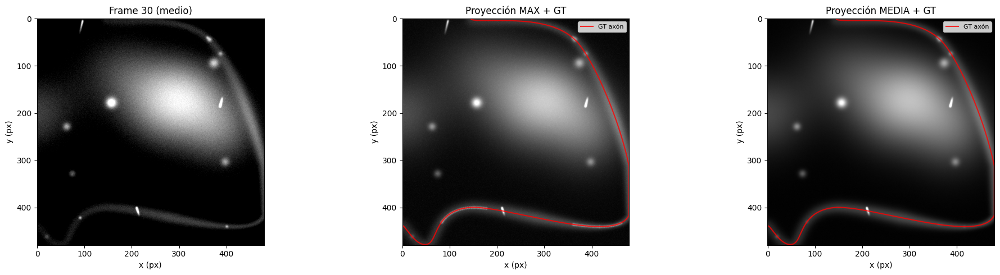

Proyección media — rango de intensidad: 2556.6 - 65535.0


In [10]:
proj_max = movie.max(axis=0).astype(np.float32)  # (H, W)
proj_mean = movie.mean(axis=0).astype(np.float32)  # (H, W)


# Normalizar a [0, 255] uint8 para PIL
def norm_uint8(arr):
    lo, hi = arr.min(), arr.max()
    return ((arr - lo) / max(hi - lo, 1e-6) * 255).astype(np.uint8)


proj_max_u8 = norm_uint8(proj_max)
proj_mean_u8 = norm_uint8(proj_mean)

# GT polyline del axón
poly = axon_path.polyline  # (N, 2) columnas [x, y]

fig, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(
    movie[T // 2], cmap="gray", vmin=movie_vmin, vmax=movie_vmax
)  # ver seccion 1: vmin/vmax de percentiles, no 0-255 (movie es uint16)
axes[0].set_title(f"Frame {T//2} (medio)")

axes[1].imshow(proj_max_u8, cmap="gray")
axes[1].plot(poly[:, 0], poly[:, 1], "r-", linewidth=1.5, alpha=0.8, label="GT axón")
axes[1].set_title("Proyección MAX + GT")
axes[1].legend(fontsize=8)

axes[2].imshow(proj_mean_u8, cmap="gray")
axes[2].plot(poly[:, 0], poly[:, 1], "r-", linewidth=1.5, alpha=0.8, label="GT axón")
axes[2].set_title("Proyección MEDIA + GT")
axes[2].legend(fontsize=8)

for ax in axes:
    ax.set_xlabel("x (px)")
    ax.set_ylabel("y (px)")
plt.tight_layout()
plt.show()

print(
    "Proyección media — rango de intensidad:",
    proj_mean.min().round(1),
    "-",
    proj_mean.max().round(1),
)

---

## 3. Cargar SAM3


In [9]:
from transformers import Sam3Processor, Sam3Model

MODEL_ID = "facebook/sam3"
print(f"Cargando {MODEL_ID} en bfloat16...")
processor_sam3 = Sam3Processor.from_pretrained(MODEL_ID)
model_sam3 = Sam3Model.from_pretrained(MODEL_ID, dtype=torch.bfloat16).to(device).eval()
n_params = sum(p.numel() for p in model_sam3.parameters()) / 1e6
print(f"OK — SAM3 en {device} ({n_params:.0f} M params, dtype=bfloat16)")

Cargando facebook/sam3 en bfloat16...


Loading weights:   0%|          | 0/1468 [00:00<?, ?it/s]

OK — SAM3 en mps (840 M params, dtype=bfloat16)


---

## 4. Enfoque A — Proyección temporal + SAM3 con texto

Probamos varios prompts de texto sobre la proyección media (que muestra el tubo del axón más claramente). El objetivo es que SAM3 segmente la franja brillante que es el axón.


In [14]:
SCORE_THRESHOLD = 0.3
TEXT_QUERIES = [
    "bright elongated structure",
    "bright fluorescent axon",
    "bright line",
    "bright tube",
]

pil_mean = Image.fromarray(proj_mean_u8).convert("RGB")  # SAM3 espera RGB


def _to_bf16(inputs):
    """Castea las entradas flotantes al dtype del modelo (bfloat16)."""
    return {
        k: v.to(dtype=torch.bfloat16) if v.is_floating_point() else v
        for k, v in inputs.items()
    }


def segmentar_con_texto(image_pil, text, threshold=SCORE_THRESHOLD):
    inputs = processor_sam3(images=image_pil, text=text, return_tensors="pt").to(device)
    with torch.no_grad():
        outputs = model_sam3(**_to_bf16(inputs))
    res = processor_sam3.post_process_instance_segmentation(
        outputs,
        threshold=threshold,
        target_sizes=[(image_pil.size[1], image_pil.size[0])],
    )[0]
    masks = res.get("masks", None)
    scores = res.get("scores", None)
    if masks is not None and hasattr(masks, "cpu"):
        masks = masks.cpu().numpy().astype(bool)
    if masks is None:
        masks = np.zeros((0, image_pil.size[1], image_pil.size[0]), dtype=bool)
    return masks, scores


resultados_texto = {}
for q in TEXT_QUERIES:
    masks, scores = segmentar_con_texto(pil_mean, q)
    resultados_texto[q] = (masks, scores)
    print(f'  "{q}" → {len(masks)} máscaras')

  "bright elongated structure" → 0 máscaras
  "bright fluorescent axon" → 1 máscaras
  "bright line" → 4 máscaras
  "bright tube" → 0 máscaras


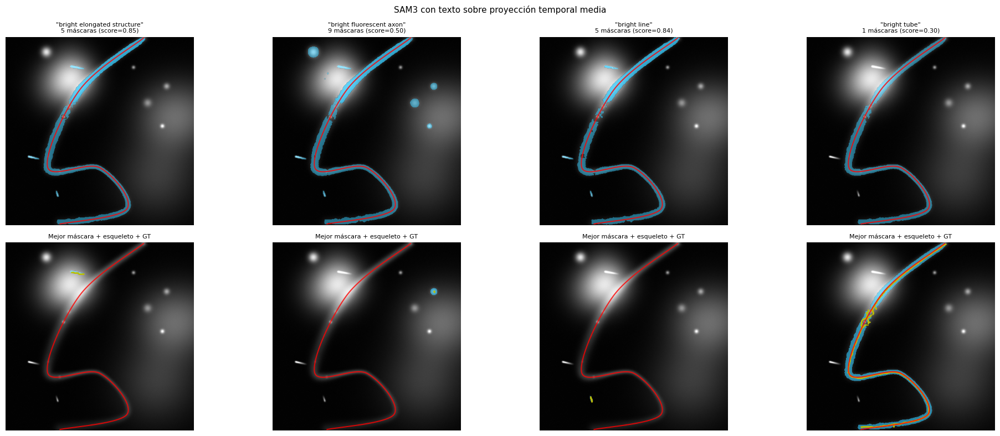

In [30]:
n_q = len(TEXT_QUERIES)
fig, axes = plt.subplots(2, n_q, figsize=(5 * n_q, 8))

for col, q in enumerate(TEXT_QUERIES):
    masks, scores = resultados_texto[q]

    # Fila 0: todas las máscaras superpuestas
    ax_top = axes[0, col]
    ax_top.imshow(proj_mean_u8, cmap="gray")
    for m in masks:
        overlay = np.zeros((H, W, 4), dtype=np.float32)
        overlay[m] = [0.2, 0.8, 1.0, 0.5]
        ax_top.imshow(overlay)
    ax_top.plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, alpha=0.8)
    s_text = (
        f" (score={float(scores.max()):.2f})"
        if scores is not None and len(scores)
        else ""
    )
    ax_top.set_title(f'"{q}"\n{len(masks)} máscaras{s_text}', fontsize=8)
    ax_top.axis("off")

    # Fila 1: mejor máscara (si hay alguna)
    ax_bot = axes[1, col]
    ax_bot.imshow(proj_mean_u8, cmap="gray")
    if len(masks) > 0:
        best = masks[0]  # SAM3 las ordena por score
        overlay = np.zeros((H, W, 4), dtype=np.float32)
        overlay[best] = [0.2, 0.8, 1.0, 0.6]
        ax_bot.imshow(overlay)
        # Esqueleto de la mejor máscara
        skel = skeletonize(best)
        ys, xs = np.where(skel)
        if len(xs) > 1:
            order = np.argsort(xs)
            ax_bot.plot(xs[order], ys[order], "y.", ms=1.5, label="esqueleto")
    ax_bot.plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, alpha=0.8, label="GT")
    ax_bot.set_title("Mejor máscara + esqueleto + GT", fontsize=8)
    ax_bot.axis("off")

plt.suptitle("SAM3 con texto sobre proyección temporal media", fontsize=11)
plt.tight_layout()
plt.show()

---

## 5. Enfoque A alternativo — bounding box que cubre la imagen

Si los prompts de texto no funcionan bien (SAM3 fue entrenado en imágenes naturales, no microscopía), una alternativa es darle una bounding box que cubre casi toda la imagen. En la proyección temporal, el objeto más prominente debería ser el axón.


SAM3 con bbox completa → 1 máscaras


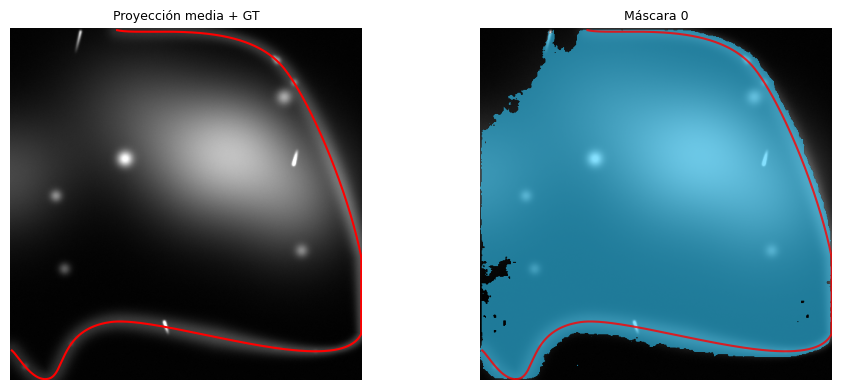

In [17]:
# Bounding box = margen de 2 px
margen = 2
box_toda = [[margen, margen, W - margen, H - margen]]

inputs_box = processor_sam3(
    images=pil_mean,
    input_boxes=[box_toda],  # [imagen, objeto, [x1,y1,x2,y2]]
    return_tensors="pt",
).to(device)
with torch.no_grad():
    outputs_box = model_sam3(**_to_bf16(inputs_box))

res_box = processor_sam3.post_process_instance_segmentation(
    outputs_box,
    threshold=0.2,
    target_sizes=[(pil_mean.size[1], pil_mean.size[0])],
)[0]
masks_box = res_box.get("masks", None)
if masks_box is not None and hasattr(masks_box, "cpu"):
    masks_box = masks_box.cpu().numpy().astype(bool)
if masks_box is None:
    masks_box = np.zeros((0, H, W), dtype=bool)

print(f"SAM3 con bbox completa → {len(masks_box)} máscaras")

fig, axes = plt.subplots(
    1, min(len(masks_box) + 1, 4), figsize=(5 * min(len(masks_box) + 1, 4), 4)
)
if not hasattr(axes, "__len__"):
    axes = [axes]
axes[0].imshow(proj_mean_u8, cmap="gray")
axes[0].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5)
axes[0].set_title("Proyección media + GT", fontsize=9)
axes[0].axis("off")
for i, m in enumerate(masks_box[:3]):
    ax = axes[i + 1]
    ax.imshow(proj_mean_u8, cmap="gray")
    ov = np.zeros((H, W, 4), dtype=np.float32)
    ov[m] = [0.2, 0.8, 1.0, 0.6]
    ax.imshow(ov)
    ax.plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, alpha=0.8)
    ax.set_title(f"Máscara {i}", fontsize=9)
    ax.axis("off")
plt.tight_layout()
plt.show()

---

## 6. Evaluación cuantitativa: máscara predicha vs GT

Para cada máscara predicha calculamos:

- **Recall del GT**: fracción de los puntos del GT que caen dentro de la máscara.
- **Precisión**: fracción de pixels de la máscara que están cerca del GT (dentro de `d_thr` px).
- **Distancia media** de los puntos del GT al borde más cercano de la máscara.
- **F-beta** (β=2, recall pesa 4x más que precisión) y **área cubierta** (fracción del frame).

Un buen detector del axón debería tener recall alto (captura todo el eje del axón) y precisión aceptable (no segmenta áreas irrelevantes). El peso extra a recall en F-beta refleja el uso previsto: un humano revisa y recorta la propuesta después, así que perder una parte real del axón (bajo recall) sale más caro que proponer área de más (baja precisión) -- eso se puede recortar.

**Ojo con esto**: recall solo, o F-beta con β alto, se ganan trivialmente proponiendo _todo el frame_ como máscara (recall=1.00 automático -- ver Enfoque A-bbox más abajo). Por eso se reporta también el área cubierta: cualquier lectura por recall/F-beta tiene que excluir primero las propuestas degeneradas (área muy alta), no compararlas directamente contra propuestas localizadas.


In [18]:
from scipy.ndimage import distance_transform_edt

D_THR_PX = 5.0  # distancia máxima para considerar un punto «dentro» del axón
F_BETA = 2.0  # peso de recall en el score combinado (recall pesa F_BETA**2 más que precisión)


def evaluar_mascara(mask, gt_poly, d_thr=D_THR_PX, beta=F_BETA):
    """Recall, precisión, distancia media GT->máscara, F-beta y área cubierta.

    F-beta con beta>1 pesa más el recall: perder parte del GT (bajo recall) es
    peor que proponer área de más (baja precisión), porque un humano recorta
    la propuesta después pero no puede recuperar lo que nunca se propuso. OJO:
    esto se gana trivialmente cubriendo todo el frame (recall=1) -- por eso
    area_frac va siempre junto a f_beta, para descartar esos casos antes de
    comparar (ver sección 12).
    """
    if not mask.any():
        return dict(
            recall=0.0,
            precision=0.0,
            mean_dist_gt_px=np.inf,
            n_px_mask=0,
            f_beta=0.0,
            area_frac=0.0,
        )

    # Distancia de cada pixel a la máscara (transform de distancia en la máscara invertida)
    dist_to_mask = distance_transform_edt(~mask)  # (H, W)

    # Recall: fracción de puntos GT que están dentro de la máscara dilatada en d_thr
    gt_x = np.clip(gt_poly[:, 0].astype(int), 0, mask.shape[1] - 1)
    gt_y = np.clip(gt_poly[:, 1].astype(int), 0, mask.shape[0] - 1)
    dist_gt = dist_to_mask[gt_y, gt_x]
    recall = float((dist_gt <= d_thr).mean())
    mean_dist = float(dist_gt.mean())

    # Precisión: de todos los pixels de la máscara, ¿cuántos están cerca del GT?
    gt_mask_img = np.zeros(mask.shape, dtype=bool)
    gt_mask_img[gt_y, gt_x] = True
    dist_to_gt = distance_transform_edt(~gt_mask_img)
    mask_pixels_dist = dist_to_gt[mask]
    precision = float((mask_pixels_dist <= d_thr).mean())

    f_beta = (
        (1 + beta**2) * precision * recall / (beta**2 * precision + recall)
        if (precision + recall) > 0
        else 0.0
    )
    area_frac = float(mask.sum()) / mask.size

    return dict(
        recall=recall,
        precision=precision,
        mean_dist_gt_px=mean_dist,
        n_px_mask=int(mask.sum()),
        f_beta=f_beta,
        area_frac=area_frac,
    )


print(f"Umbral de distancia: {D_THR_PX} px = {D_THR_PX * PIXEL_SCALE:.3f} µm")
print(f"F-beta: beta={F_BETA} (recall pesa {F_BETA**2:.0f}x más que precisión)")
print()

# Evaluamos la mejor máscara de cada query de texto
print("Enfoque A -- texto:")
for q, (masks, _) in resultados_texto.items():
    if len(masks) == 0:
        print(f'  "{q:35s}" -> sin máscaras')
        continue
    m = evaluar_mascara(masks[0], poly)
    print(
        f'  "{q:35s}" recall={m["recall"]:.2f}  precision={m["precision"]:.2f}  '
        f'f_beta={m["f_beta"]:.2f}  área={100*m["area_frac"]:.1f}%  '
        f'dist_media={m["mean_dist_gt_px"]:.1f}px  n_px={m["n_px_mask"]}'
    )

print()
print("Enfoque A -- bounding box:")
for i, m_arr in enumerate(masks_box[:3]):
    m = evaluar_mascara(m_arr, poly)
    print(
        f'  Máscara {i}: recall={m["recall"]:.2f}  precision={m["precision"]:.2f}  '
        f'f_beta={m["f_beta"]:.2f}  área={100*m["area_frac"]:.1f}%  '
        f'dist_media={m["mean_dist_gt_px"]:.1f}px  n_px={m["n_px_mask"]}'
    )

Umbral de distancia: 5.0 px = 0.535 µm
F-beta: beta=2.0 (recall pesa 4x más que precisión)

Enfoque A -- texto:
  "bright elongated structure         " -> sin máscaras
  "bright fluorescent axon            " recall=0.00  precision=0.00  f_beta=0.00  área=0.2%  dist_media=268.0px  n_px=525
  "bright line                        " recall=0.00  precision=0.00  f_beta=0.00  área=0.1%  dist_media=225.0px  n_px=124
  "bright tube                        " -> sin máscaras

Enfoque A -- bounding box:
  Máscara 0: recall=1.00  precision=0.06  f_beta=0.25  área=80.1%  dist_media=0.1px  n_px=184449


---

## 7. Enfoque B — Unión de detecciones sobre frames muestreados

La intuición original: **las partículas trazan el axón**. Para capturar esto no necesitamos procesar todos los frames — basta con muestrear algunos frames distribuidos en el tiempo y unir las detecciones.

Usamos el **modelo de imagen** y evita cargar un segundo modelo. Para detección del ROI del axón, la calidad es equivalente: nos interesa la unión de posiciones, no la identidad de cada partícula — pero al procesar cada frame de forma independiente se pierde cualquier señal de continuidad temporal (una partícula tenue en un frame aislado no se beneficia de haber sido clara en el frame anterior).

|                   | SAM3-Video (Enfoque E, §10)         | SAM3 imagen + muestreo (este enfoque)   |
| ----------------- | ----------------------------------- | --------------------------------------- |
| Frames procesados | T=60 (todos, con memoria)           | N muestreados (e.g. 32, independientes) |
| Modelo adicional  | Sam3VideoModel (detector + tracker) | ninguno (ya cargado)                    |
| Tiempo            | ~4 min (medido, ver §10)            | ~2 min                                  |


In [33]:
import gc

N_SAMPLE_FRAMES = 32  # frames distribuidos uniformemente a lo largo del video
QUERY_PARTICULAS = "small bright dot"

frame_idxs = np.linspace(0, T - 1, N_SAMPLE_FRAMES).astype(int)
print(f"movie dtype: {movie.dtype}")
print(f"Muestreando {N_SAMPLE_FRAMES} frames de {T} (índices: {frame_idxs[:5]}...)")

union_mask = np.zeros((H, W), dtype=bool)
detecciones_por_frame = {}  # frame_idx -> n_mascaras

for i, fidx in enumerate(frame_idxs):
    frame_u8 = norm_uint8(movie[fidx].astype(np.float32))  # uint16 → uint8
    pil_frame = Image.fromarray(np.stack([frame_u8, frame_u8, frame_u8], axis=-1))
    masks, _ = segmentar_con_texto(
        pil_frame, QUERY_PARTICULAS, threshold=SCORE_THRESHOLD
    )
    detecciones_por_frame[int(fidx)] = len(masks)
    for m in masks:
        union_mask |= m
    if (i + 1) % 8 == 0:
        print(
            f"  {i+1}/{N_SAMPLE_FRAMES} frames procesados — máscaras acumuladas: {union_mask.sum()} px"
        )

gc.collect()
if torch.backends.mps.is_available():
    torch.mps.empty_cache()

n_union = union_mask.sum()
print(f"\nUnión de máscaras: {n_union} pixels  ({100*n_union/(H*W):.1f}% del frame)")

movie dtype: uint16
Muestreando 32 frames de 60 (índices: [0 1 3 5 7]...)
  8/32 frames procesados — máscaras acumuladas: 3020 px
  16/32 frames procesados — máscaras acumuladas: 3382 px
  24/32 frames procesados — máscaras acumuladas: 3431 px
  32/32 frames procesados — máscaras acumuladas: 3714 px

Unión de máscaras: 3714 pixels  (1.6% del frame)


recall=0.35  precision=0.40  dist_media=29.9px


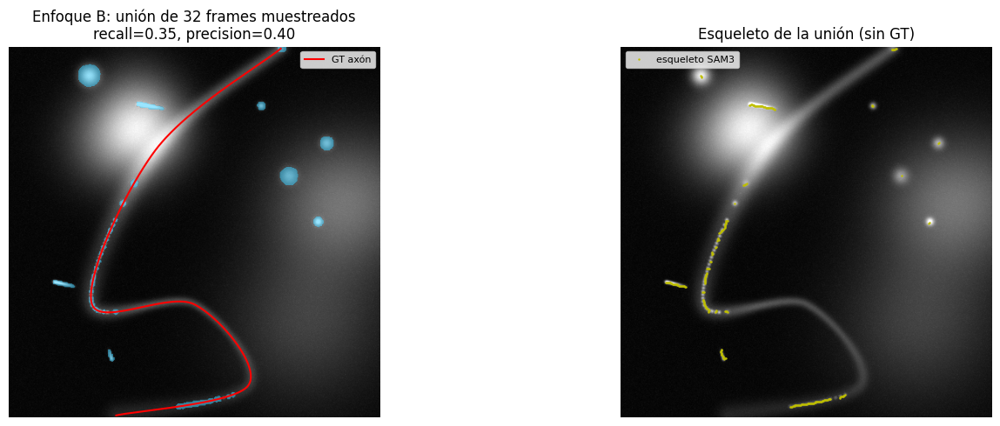

In [34]:
met_union = evaluar_mascara(union_mask, poly)
print(
    f"recall={met_union['recall']:.2f}  precision={met_union['precision']:.2f}  "
    f"dist_media={met_union['mean_dist_gt_px']:.1f}px"
)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].imshow(proj_max_u8, cmap="gray")
ov = np.zeros((H, W, 4), dtype=np.float32)
ov[union_mask] = [0.2, 0.8, 1.0, 0.5]
axes[0].imshow(ov)
axes[0].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, label="GT axón")
axes[0].set_title(
    f"Enfoque B: unión de {N_SAMPLE_FRAMES} frames muestreados\n"
    f"recall={met_union['recall']:.2f}, precision={met_union['precision']:.2f}"
)
axes[0].legend(fontsize=8)
axes[0].axis("off")

# Esqueleto de la unión (sin GT encima)
axes[1].imshow(proj_max_u8, cmap="gray")
if union_mask.any():
    skel_union = skeletonize(union_mask)
    ys_s, xs_s = np.where(skel_union)
    if len(xs_s) > 0:
        order = np.argsort(xs_s)
        axes[1].plot(xs_s[order], ys_s[order], "y.", ms=1.5, label="esqueleto SAM3")
axes[1].set_title("Esqueleto de la unión (sin GT)")
axes[1].legend(fontsize=8)
axes[1].axis("off")

plt.tight_layout()
plt.show()

---

## 8. Enfoque C — Proyección máxima + SAM3 + closing morfológico

La proyección máxima colapsa **todos** los frames en una sola imagen: cada pixel toma el valor más alto que tuvo en cualquier momento. Una partícula que recorre el axón de izquierda a derecha deja un rastro brillante a lo largo de todo su camino — sin necesidad de muestrear frames ni hacer varias inferencias.

La idea:

1. `proj_max[y, x] = max sobre t de movie[t, y, x]` → un único mapa de "dónde estuvo alguna vez algo brillante"
2. SAM3 sobre esa imagen para segmentar las regiones brillantes
3. Closing morfológico para unir detecciones vecinas en una región continua

Ventaja sobre Enfoque B: **una sola inferencia SAM3**, usa toda la información temporal.


Enfoque C — SAM3 sobre proyección MAX + closing=8px

  "small bright dot    " → 17 máscaras  recall=0.12  precision=0.13  dist=41.3px
  "bright path         " → 0 máscaras  recall=0.00  precision=0.00  dist=infpx
  "bright streak       " → 12 máscaras  recall=0.99  precision=0.60  dist=0.3px


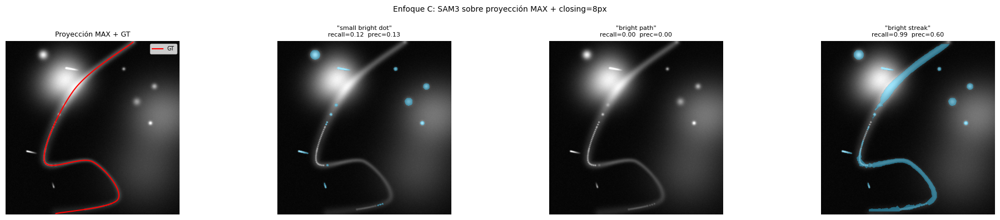

In [35]:
from scipy.ndimage import binary_closing

QUERIES_C = ["small bright dot", "bright path", "bright streak"]
CLOSING_RADIUS_C = 8  # px — une detecciones vecinas para formar una región continua

pil_max = Image.fromarray(proj_max_u8).convert("RGB")

print(f"Enfoque C — SAM3 sobre proyección MAX + closing={CLOSING_RADIUS_C}px\n")

resultados_c = {}
for q in QUERIES_C:
    masks, _ = segmentar_con_texto(pil_max, q)
    union = np.zeros((H, W), dtype=bool)
    for m in masks:
        union |= m
    union_closed = (
        binary_closing(union, iterations=CLOSING_RADIUS_C) if union.any() else union
    )
    met = evaluar_mascara(union_closed, poly)
    resultados_c[q] = (union_closed, met)
    print(
        f'  "{q:20s}" → {len(masks)} máscaras  '
        f'recall={met["recall"]:.2f}  precision={met["precision"]:.2f}  '
        f'dist={met["mean_dist_gt_px"]:.1f}px'
    )

# Visualización: proyección MAX + cada resultado
n_q = len(QUERIES_C)
fig, axes = plt.subplots(1, n_q + 1, figsize=(5 * (n_q + 1), 4))

axes[0].imshow(proj_max_u8, cmap="gray")
axes[0].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, label="GT")
axes[0].set_title("Proyección MAX + GT", fontsize=9)
axes[0].legend(fontsize=7)
axes[0].axis("off")

for col, q in enumerate(QUERIES_C):
    ax = axes[col + 1]
    mask_c, met = resultados_c[q]
    ax.imshow(proj_max_u8, cmap="gray")
    ov = np.zeros((H, W, 4), dtype=np.float32)
    ov[mask_c] = [0.2, 0.8, 1.0, 0.45]
    ax.imshow(ov)
    ax.set_title(
        f'"{q}"\nrecall={met["recall"]:.2f}  prec={met["precision"]:.2f}',
        fontsize=8,
    )
    ax.axis("off")

plt.suptitle(
    f"Enfoque C: SAM3 sobre proyección MAX + closing={CLOSING_RADIUS_C}px", fontsize=10
)
plt.tight_layout()
plt.show()

---

## 9. Enfoque D — Ajuste de curva paramétrica sobre centroides de detecciones

En lugar de acumular una máscara binaria, este enfoque **localiza** cada detección SAM3 en su centroide y ajusta una curva paramétrica a esa nube de puntos.

| Paso | Descripción                                                                        |
| ---- | ---------------------------------------------------------------------------------- |
| 1    | SAM3 sobre N frames muestreados → centroide de cada máscara detectada              |
| 2    | DBSCAN: filtrar clusters aislados (artefactos fuera del axón)                      |
| 3    | Ordenamiento por MST (_minimum spanning tree_) — **agnóstico a la forma del axón** |
| 4    | Spline paramétrico `x(t), y(t)` ajustado sobre los puntos ordenados                |
| 5    | Rasterización de la curva + evaluación con `evaluar_mascara`                       |

El ordenamiento por MST no asume que el axón sea recto, monótono en x o y, ni ninguna forma particular. Es válido para cualquier geometría 1D embebida en 2D.


In [36]:
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import cdist
from scipy.sparse.csgraph import minimum_spanning_tree
from scipy.interpolate import splprep, splev

# ── 1. Recolectar centroides de detecciones SAM3 ──────────────────────────────
N_FRAMES_D = N_SAMPLE_FRAMES
QUERY_D = QUERY_PARTICULAS  # "small bright dot"

centroides = []
for fidx in frame_idxs:
    frame_u8 = norm_uint8(movie[fidx].astype(np.float32))
    pil_frame = Image.fromarray(np.stack([frame_u8, frame_u8, frame_u8], axis=-1))
    masks_d, _ = segmentar_con_texto(pil_frame, QUERY_D, threshold=SCORE_THRESHOLD)
    for m in masks_d:
        ys_m, xs_m = np.where(m)
        if len(xs_m) > 0:
            centroides.append([xs_m.mean(), ys_m.mean()])

centroides = np.array(centroides)
print(f"Centroides recolectados: {len(centroides)}")

# ── 2. Filtrado por DBSCAN ────────────────────────────────────────────────────
DBSCAN_EPS = 15  # px
DBSCAN_MIN = 2  # 2 en vez de 3: los extremos del axón tienen detecciones más dispersas

if len(centroides) < DBSCAN_MIN:
    print("Muy pocos centroides — se usan todos sin filtrar")
    centroides_axon = centroides
else:
    db = DBSCAN(eps=DBSCAN_EPS, min_samples=DBSCAN_MIN).fit(centroides)
    labels = db.labels_
    unique_labels = set(labels) - {-1}

    best_label, best_extent = None, 0.0
    for lbl in unique_labels:
        pts_lbl = centroides[labels == lbl]
        extent = max(
            float(pts_lbl[:, 0].max() - pts_lbl[:, 0].min()),
            float(pts_lbl[:, 1].max() - pts_lbl[:, 1].min()),
        )
        if extent > best_extent:
            best_extent, best_label = extent, lbl

    centroides_axon = (
        centroides[labels == best_label] if best_label is not None else centroides
    )
    n_noise = (labels == -1).sum()
    print(
        f"  {len(unique_labels)} clusters, {n_noise} ruido → cluster axón: {len(centroides_axon)} pts (extensión={best_extent:.0f} px)"
    )

# ── 2b. Dedup espacial antes del MST ─────────────────────────────────────────
GRID_SIZE = 5  # px


def grid_dedup(pts: np.ndarray, grid_size: float) -> np.ndarray:
    """Conserva un punto representativo por celda de grilla cuadrada."""
    keys = np.floor(pts / grid_size).astype(int)
    seen_cells, keep = set(), []
    for i, k in enumerate(map(tuple, keys)):
        if k not in seen_cells:
            seen_cells.add(k)
            keep.append(i)
    return pts[keep]


centroides_sparse = grid_dedup(centroides_axon, GRID_SIZE)
print(f"  Tras dedup espacial ({GRID_SIZE}px grid): {len(centroides_sparse)} pts")


# ── 3. Ordenamiento por MST (agnóstico a la forma) ───────────────────────────
def ordenar_por_mst(pts: np.ndarray) -> np.ndarray:
    """Ordena pts a lo largo de su mínimo árbol de expansión.

    Funciona para cualquier curva 1D embebida en 2D: recta, curva, L, S, etc.
    """
    if len(pts) < 2:
        return pts
    D = cdist(pts, pts)
    mst = minimum_spanning_tree(D).toarray()
    adj = mst + mst.T
    degrees = (adj > 0).sum(axis=1)
    leaves = np.where(degrees == 1)[0]
    start = int(leaves[0]) if len(leaves) > 0 else 0
    visited, seen, stack = [], set(), [start]
    while stack:
        node = stack.pop()
        if node in seen:
            continue
        seen.add(node)
        visited.append(node)
        neighbors = np.where(adj[node] > 0)[0]
        for nb in sorted(neighbors, key=lambda n: adj[node, n], reverse=True):
            if nb not in seen:
                stack.append(nb)
    return pts[visited]


pts_ordenados = ordenar_por_mst(centroides_sparse)


def dedup_consecutive(pts: np.ndarray, min_dist: float = 0.5) -> np.ndarray:
    if len(pts) < 2:
        return pts
    keep = [0]
    for i in range(1, len(pts)):
        if np.linalg.norm(pts[i] - pts[keep[-1]]) >= min_dist:
            keep.append(i)
    return pts[keep]


pts_ordenados = dedup_consecutive(pts_ordenados, min_dist=0.5)
print(f"Puntos para spline: {len(pts_ordenados)}")

# ── 4. Ajuste de spline paramétrico x(t), y(t) ───────────────────────────────
SPLINE_SMOOTH = len(pts_ordenados) * 30

curva_pts = None
if len(pts_ordenados) >= 4:
    xs_o, ys_o = pts_ordenados[:, 0], pts_ordenados[:, 1]
    tck, _ = splprep([xs_o, ys_o], s=SPLINE_SMOOTH, k=3)
    t_fine = np.linspace(0, 1, 1000)
    x_curva, y_curva = splev(t_fine, tck)
    curva_pts = np.stack([x_curva, y_curva], axis=1)
    print(f"Spline paramétrico ajustado (s={SPLINE_SMOOTH})")
else:
    print("Muy pocos puntos para ajustar spline cúbico (necesita ≥ 4)")

Centroides recolectados: 449
  13 clusters, 0 ruido → cluster axón: 64 pts (extensión=119 px)
  Tras dedup espacial (5px grid): 19 pts
Puntos para spline: 19
Spline paramétrico ajustado (s=570)


Enfoque D: recall=0.19  precision=0.91  dist_media=113.2 px


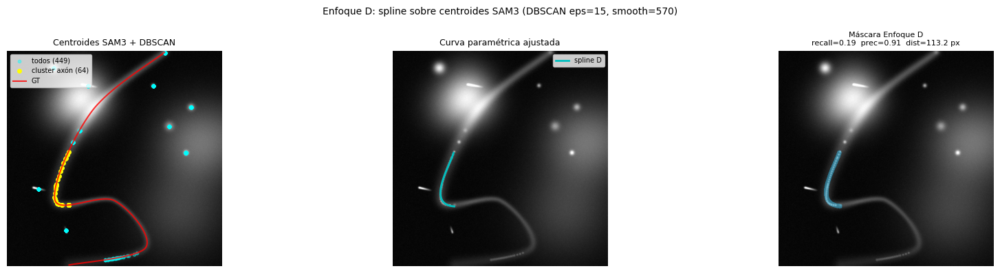

In [37]:
if curva_pts is None:
    print("Spline no disponible — revisar pasos anteriores")
else:
    # Rasterizar la curva: dilatarla D_THR_PX para obtener una franja evaluable
    xs_c = np.clip(curva_pts[:, 0].astype(int), 0, W - 1)
    ys_c = np.clip(curva_pts[:, 1].astype(int), 0, H - 1)
    skel_d = np.zeros((H, W), dtype=bool)
    skel_d[ys_c, xs_c] = True
    roi_mask_d = distance_transform_edt(~skel_d) <= D_THR_PX

    met_d = evaluar_mascara(roi_mask_d, poly)
    print(
        f"Enfoque D: recall={met_d['recall']:.2f}  "
        f"precision={met_d['precision']:.2f}  "
        f"dist_media={met_d['mean_dist_gt_px']:.1f} px"
    )

    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    # Panel 1 — nube de centroides (todos + cluster axón)
    axes[0].imshow(proj_max_u8, cmap="gray")
    axes[0].scatter(
        centroides[:, 0],
        centroides[:, 1],
        c="cyan",
        s=10,
        alpha=0.4,
        label=f"todos ({len(centroides)})",
    )
    axes[0].scatter(
        centroides_axon[:, 0],
        centroides_axon[:, 1],
        c="yellow",
        s=16,
        label=f"cluster axón ({len(centroides_axon)})",
    )
    axes[0].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, alpha=0.8, label="GT")
    axes[0].set_title(f"Centroides SAM3 + DBSCAN", fontsize=9)
    axes[0].legend(fontsize=7, loc="upper left")
    axes[0].axis("off")

    # Panel 2 — spline ajustado (sin GT para ver solo la salida del método)
    axes[1].imshow(proj_max_u8, cmap="gray")
    axes[1].plot(curva_pts[:, 0], curva_pts[:, 1], "c-", lw=2, label="spline D")
    axes[1].set_title("Curva paramétrica ajustada", fontsize=9)
    axes[1].legend(fontsize=7)
    axes[1].axis("off")

    # Panel 3 — máscara rasterizada + métricas
    axes[2].imshow(proj_max_u8, cmap="gray")
    ov = np.zeros((H, W, 4), dtype=np.float32)
    ov[roi_mask_d] = [0.2, 0.8, 1.0, 0.45]
    axes[2].imshow(ov)
    axes[2].set_title(
        f"Máscara Enfoque D\nrecall={met_d['recall']:.2f}  "
        f"prec={met_d['precision']:.2f}  dist={met_d['mean_dist_gt_px']:.1f} px",
        fontsize=8,
    )
    axes[2].axis("off")

    plt.suptitle(
        f"Enfoque D: spline sobre centroides SAM3 "
        f"(DBSCAN eps={DBSCAN_EPS}, smooth={SPLINE_SMOOTH})",
        fontsize=10,
    )
    plt.tight_layout()
    plt.show()

---

## 10. Enfoque E — SAM3-Video (memoria temporal)

A diferencia de A-D, `Sam3VideoModel` combina el detector SAM3 con un **tracker con memoria** (arquitectura tipo SAM2): en vez de segmentar cada frame de forma aislada, propaga una memoria de cada objeto detectado de un frame al siguiente. Esto **no es atención global sobre toda la secuencia** — es propagación causal, cuadro a cuadro. Lo que gana sobre A-D: una partícula tenue o ambigua en un frame aislado puede seguir reconociéndose porque fue clara en el frame anterior (A y C ya usan toda la información temporal, pero colapsada en una imagen estática, sin dinámica; B y D miran frames muestreados sin memoria entre ellos).

`Sam3VideoModel.from_pretrained("facebook/sam3")` usa el mismo checkpoint que ya está cacheado (sección 3) — no hace falta descargar nada nuevo, pero sí carga un modelo bastante más pesado (detector + tracker + neck) que conviene no mantener duplicado junto al `model_sam3` de esa sección.

**Costo real medido**: en la corrida guardada en este notebook, propagar T=60 frames completos a 1008×1008 tomó **~3.6 min (214s, 9 objetos trackeados)**. El tiempo varió bastante entre corridas durante el desarrollo de este notebook (se observaron valores entre ~3.6 y ~12 min, con 9-13 objetos) sin que la cantidad de objetos explique la diferencia por sí sola: el detector (840M parámetros, la parte cara del cómputo) corre sobre los 60 frames sin importar cuántos objetos haya. En cualquier caso, todos los valores medidos están lejos de la estimación de ~40 min que aparecía en la sección 7 (nunca se había corrido). No se ofrece acá una variante con frames salteados: eso rompería justo la continuidad de memoria que es la única razón de ser de este enfoque (para eso ya está Enfoque B, mucho más barato).

Nota: el paquete `kernels` no está instalado en este entorno, así que HF salta NMS y limpieza de máscaras (relleno de huecos, remoción de artefactos chicos) en el post-proceso — el resultado de acá es un piso de calidad, no el techo de lo que SAM3-Video puede dar.

**Por qué la precisión no fue mejor** (visible en la visualización de abajo, no solo en los números): el prompt `"small bright dot"` también engancha los artefactos que `synthkymo` agrega a propósito como distractores (partículas estáticas, "tails", humo — ver `config.yaml`, `movie.artifacts`). La memoria temporal no filtra esto por sí sola: un artefacto estático es, si acaso, más fácil de trackear de forma continua que una vesícula real en movimiento. La sección 11 (Enfoque E2) usa la identidad de objeto (`obj_id`) que el tracker ya da gratis para filtrar esto por desplazamiento.


In [38]:
# Smoke test: cargar Sam3VideoModel y confirmar que el tracker NO cargó con
# pesos random. output_loading_info=True es el mecanismo correcto para esto
# (el mensaje de HF sobre pesos "newly initialized" va por logger, no por
# warnings.warn, así que warnings.catch_warnings no lo detectaría).

# Libera la copia del detector de la sección 3 antes de cargar el modelo de
# video (que trae su propio detector + tracker + neck) para no duplicar
# memoria innecesariamente.
del model_sam3, processor_sam3
gc.collect()
if torch.backends.mps.is_available():
    torch.mps.empty_cache()

from transformers import Sam3VideoModel, Sam3VideoProcessor

print(f"Cargando Sam3VideoModel ({MODEL_ID}) en bfloat16...")
model_sam3_video, loading_info = Sam3VideoModel.from_pretrained(
    MODEL_ID, dtype=torch.bfloat16, output_loading_info=True
)
model_sam3_video = model_sam3_video.to(device).eval()
processor_sam3_video = Sam3VideoProcessor.from_pretrained(MODEL_ID)

assert not loading_info["missing_keys"], (
    f"Pesos del tracker faltantes en el checkpoint -- cargaria con pesos "
    f"random: {loading_info['missing_keys']}"
)
assert not loading_info["unexpected_keys"], (
    f"Keys inesperadas en el checkpoint (¿mismatch de version?): "
    f"{loading_info['unexpected_keys']}"
)

n_det = sum(p.numel() for p in model_sam3_video.detector_model.parameters()) / 1e6
n_trk = sum(p.numel() for p in model_sam3_video.tracker_model.parameters()) / 1e6
n_neck = sum(p.numel() for p in model_sam3_video.tracker_neck.parameters()) / 1e6
print("OK -- sin missing/unexpected keys")
print(f"  detector: {n_det:.1f}M  tracker: {n_trk:.1f}M  tracker_neck: {n_neck:.1f}M")
if torch.backends.mps.is_available():
    print(f"  MPS allocated: {torch.mps.current_allocated_memory()/1e9:.2f} GB")

Cargando Sam3VideoModel (facebook/sam3) en bfloat16...


Loading weights:   0%|          | 0/1797 [00:00<?, ?it/s]

OK -- sin missing/unexpected keys
  detector: 840.4M  tracker: 11.7M  tracker_neck: 7.8M
  MPS allocated: 17.07 GB


In [39]:
def frames_to_sam3video_input(movie: np.ndarray) -> list[np.ndarray]:
    """Normaliza el video GLOBALMENTE (un solo percentil p50-p99.8 sobre todo
    el stack) y devuelve una lista de frames RGB uint8.

    A diferencia de norm_uint8() (min-max por frame, usado en A-D), acá hace
    falta UNA sola normalización para todo el clip: apilar frames normalizados
    de forma independiente inyectaría parpadeo de brillo/contraste artificial
    entre frames, que rompería justo la señal de continuidad temporal que
    Enfoque E existe para explotar.
    """
    lo, hi = np.percentile(movie, [50, 99.8])
    movie_u8 = np.clip(
        (movie.astype(np.float32) - lo) / max(hi - lo, 1e-6) * 255, 0, 255
    ).astype(np.uint8)
    return [np.stack([f, f, f], axis=-1) for f in movie_u8]


def particle_px_en_resolucion(
    target_size: int, movie_width: int = W, config: dict = CONFIG
) -> tuple[float, float]:
    """Tamaño esperado (min, max) de una partícula en píxeles de MODELO, para
    un target_size de resize dado. Sirve para decidir si vale la pena bajar
    la resolución de inferencia (más rápido, pero las partículas -ya chicas-
    se achican más)."""
    px_scale = config["general"]["pixel_scale_um"]
    d_min_um = config["particles"]["size_um"]["min"]
    d_max_um = config["particles"]["size_um"]["max"]
    upscale = target_size / movie_width
    return d_min_um / px_scale * upscale, d_max_um / px_scale * upscale


print("Tamaño de partícula según resolución de inferencia:")
for target in [1008, 720, 560, 384]:
    lo_px, hi_px = particle_px_en_resolucion(target)
    print(
        f"  target_size={target:5d} -> partícula ≈ {lo_px:.1f}-{hi_px:.1f} px en el modelo"
    )
print(
    "\nSe usa el default de SAM3 (1008px, documentado por HF como la resolución "
    "prevista): a esa resolución las partículas ya son marginalmente chicas -- "
    "bajarla reduce aún más una señal al límite. Para probar otra resolución hay "
    "que recargar el modelo con Sam3VideoConfig(image_size=...) y el processor con "
    "size={'height':...,'width':...} (ver docs de Sam3VideoConfig)."
)

Tamaño de partícula según resolución de inferencia:
  target_size= 1008 -> partícula ≈ 3.0-7.5 px en el modelo
  target_size=  720 -> partícula ≈ 2.1-5.4 px en el modelo
  target_size=  560 -> partícula ≈ 1.7-4.2 px en el modelo
  target_size=  384 -> partícula ≈ 1.1-2.9 px en el modelo

Se usa el default de SAM3 (1008px, documentado por HF como la resolución prevista): a esa resolución las partículas ya son marginalmente chicas -- bajarla reduce aún más una señal al límite. Para probar otra resolución hay que recargar el modelo con Sam3VideoConfig(image_size=...) y el processor con size={'height':...,'width':...} (ver docs de Sam3VideoConfig).


In [40]:
# Sesión "pre-loaded" (todos los frames disponibles de antemano) en vez de
# streaming: HF recomienda pre-loaded para mejor calidad -- streaming
# desactiva las heurísticas de "hotstart" que filtran duplicados/objetos
# espurios porque necesitan ver frames futuros.
#
# init_video_session() ya hace el resize+normalize de forma vectorizada sobre
# todo el stack (sin loop por frame) -- no vale la pena armar el tensor a
# mano acá, el preprocesamiento no es el cuello de botella (ver sección 11).
frames_e = frames_to_sam3video_input(movie)

session_e = processor_sam3_video.init_video_session(
    video=frames_e,
    inference_device=device,
    dtype=torch.bfloat16,
)
processor_sam3_video.add_text_prompt(session_e, QUERY_PARTICULAS)
print(
    f"Sesión inicializada: {session_e.num_frames} frames, prompt='{QUERY_PARTICULAS}'"
)

Sesión inicializada: 60 frames, prompt='small bright dot'


In [41]:
import time
from collections import defaultdict


def sam3video_upsample_mask(
    low_res_mask,
    video_h: int,
    video_w: int,
    video_processor,
    mask_threshold: float = 0.0,
) -> np.ndarray:
    """Sube UNA máscara de baja resolución (1, H_low, W_low) a (video_h, video_w)
    booleana. Logits, no probabilidades -- threshold 0.0, no 0.5."""
    upsampled = video_processor.post_process_masks(
        [low_res_mask.unsqueeze(0).float()],
        original_sizes=[(video_h, video_w)],
        reshaped_input_sizes=[(1008, 1008)],  # video sintético cuadrado, sin padding
        mask_threshold=mask_threshold,
        binarize=True,
    )[0]
    # .astype(bool) explícito: evaluar_mascara usa `~mask`, que sobre un dtype
    # no-bool da bitwise-NOT silencioso (basura), no un error.
    return upsampled[0, 0].cpu().numpy().astype(bool)


union_mask_e = np.zeros((H, W), dtype=bool)
detecciones_por_frame_e = {}
# Por objeto trackeado (obj_id persiste entre frames -- Enfoque E2, más abajo,
# usa esto para reconstruir la trayectoria real de cada partícula en vez de
# descartar esa identidad como hace la unión de acá):
trayectorias_e = defaultdict(list)  # obj_id -> [{"frame_idx", "cx", "cy"}, ...]
masks_por_objeto_e = defaultdict(dict)  # obj_id -> {frame_idx: mask bool (H, W)}

t0 = time.time()
for out in model_sam3_video.propagate_in_video_iterator(
    inference_session=session_e,
    show_progress_bar=True,
):
    frame_mask = np.zeros((H, W), dtype=bool)
    for obj_id, low_res_mask in (out.obj_id_to_mask or {}).items():
        m = sam3video_upsample_mask(
            low_res_mask, H, W, processor_sam3_video.video_processor
        )
        if not m.any():
            continue
        frame_mask |= m
        masks_por_objeto_e[obj_id][out.frame_idx] = m
        ys_m, xs_m = np.where(m)
        trayectorias_e[obj_id].append(
            {
                "frame_idx": out.frame_idx,
                "cx": float(xs_m.mean()),
                "cy": float(ys_m.mean()),
            }
        )
    union_mask_e |= frame_mask
    detecciones_por_frame_e[out.frame_idx] = (
        len(out.object_ids) if out.object_ids else 0
    )
elapsed_e = time.time() - t0

n_union_e = union_mask_e.sum()
print(
    f"\nEnfoque E: {elapsed_e:.0f}s ({elapsed_e/60:.1f} min) -- "
    f"{n_union_e} px unidos ({100*n_union_e/(H*W):.1f}% del frame)"
)
print(
    f"Objetos trackeados en total: {len(trayectorias_e)}  "
    f"(máx por frame: {max(detecciones_por_frame_e.values(), default=0)})"
)

met_e = evaluar_mascara(union_mask_e, poly)
print(
    f"recall={met_e['recall']:.2f}  precision={met_e['precision']:.2f}  "
    f"f_beta={met_e['f_beta']:.2f}  área={100*met_e['area_frac']:.1f}%  "
    f"dist_media={met_e['mean_dist_gt_px']:.1f}px"
)

propagate in video:   0%|          | 0/60 [00:00<?, ?it/s]


Enfoque E: 368s (6.1 min) -- 4073 px unidos (1.8% del frame)
Objetos trackeados en total: 14  (máx por frame: 14)
recall=0.35  precision=0.48  f_beta=0.37  área=1.8%  dist_media=30.0px


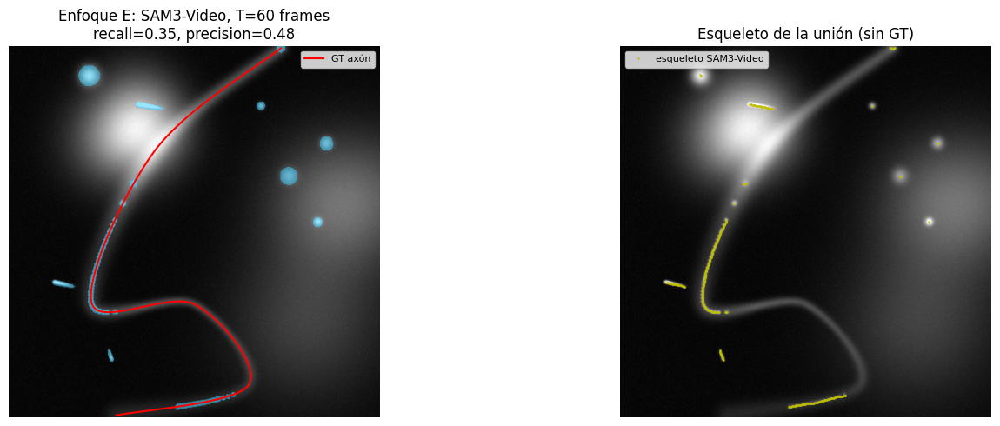

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].imshow(proj_max_u8, cmap="gray")
ov = np.zeros((H, W, 4), dtype=np.float32)
ov[union_mask_e] = [0.2, 0.8, 1.0, 0.5]
axes[0].imshow(ov)
axes[0].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, label="GT axón")
axes[0].set_title(
    f"Enfoque E: SAM3-Video, T={T} frames\n"
    f"recall={met_e['recall']:.2f}, precision={met_e['precision']:.2f}"
)
axes[0].legend(fontsize=8)
axes[0].axis("off")

axes[1].imshow(proj_max_u8, cmap="gray")
if union_mask_e.any():
    skel_e = skeletonize(union_mask_e)
    ys_e, xs_e = np.where(skel_e)
    if len(xs_e) > 0:
        order = np.argsort(xs_e)
        axes[1].plot(
            xs_e[order], ys_e[order], "y.", ms=1.5, label="esqueleto SAM3-Video"
        )
axes[1].set_title("Esqueleto de la unión (sin GT)")
axes[1].legend(fontsize=8)
axes[1].axis("off")

plt.tight_layout()
plt.show()

---

## 11. Enfoque E2 — E + filtro de objetos estáticos por desplazamiento

Enfoque E trackea partículas con identidad persistente (`obj_id`) pero la sección anterior descarta esa identidad al armar la unión — junta todo lo detectado en cualquier frame, sin distinguir una vesícula real en movimiento de un artefacto brillante y quieto. Eso es lo que le bajaba la precisión.

La idea acá: usar la identidad que el tracker ya da gratis. Para cada `obj_id`, juntamos sus centroides a lo largo de los frames en los que apareció y medimos cuánto se desplazó (diagonal del bounding box de sus centroides). Un artefacto estático debería moverse solo unos pocos px de ruido de segmentación; una partícula anterógrada/retrógrada real se desplaza decenas o cientos de px en 30s (a las velocidades del `CONFIG`, hasta ~114px en un solo tramo de movimiento). Filtramos los `obj_id` por debajo de un umbral de desplazamiento y armamos la unión solo con los que quedan.

**Importante sobre cómo leer el resultado**: la máscara de E2 es un subconjunto estricto de la de E (el filtro solo puede sacar objetos, nunca agregar) — así que `recall(E2) ≤ recall(E)` siempre, por construcción. El filtro no puede _mejorar_ el recall; en el mejor caso lo mantiene igual mientras sube la precisión (o baja el área) al sacar objetos estáticos. Leído bajo un score combinado pesado a recall (como F-beta, sección 6), el filtro va a verse neutro o peor — el efecto real está en el par (Δrecall, Δprecisión), no en un número único.

Antes de confiar en el filtro, dos chequeos que la celda de abajo imprime explícitamente: (1) la distribución de desplazamientos debería ser bimodal (estáticos cerca de 0, móviles claramente separados) — si es un continuo sin separación clara, el umbral es arbitrario. (2) cada `obj_id` debería persistir varios frames — si el tracker fragmenta una partícula real en muchos IDs de vida corta, cada fragmento se ve falsamente "estático" aunque la partícula se haya movido mucho en total, y el filtro la borraría por error.


In [43]:
DISPLACEMENT_THR_PX = (
    15.0  # objetos cuyos centroides no se separan más que esto se consideran estáticos
)


def bbox_diag(centroids: np.ndarray) -> float:
    if len(centroids) < 2:
        return 0.0
    span = centroids.max(axis=0) - centroids.min(axis=0)
    return float(np.hypot(*span))


desplazamiento_por_obj = {
    obj_id: bbox_diag(np.array([[p["cx"], p["cy"]] for p in pts]))
    for obj_id, pts in trayectorias_e.items()
}

# Chequeo empírico (ver nota de arriba): distribución completa, no solo el
# resumen filtrado -- tiene que verse bimodal y cada obj_id tiene que tener
# varios frames, si no el umbral/filtro no son confiables.
print(f"{'obj_id':>8} {'n_frames':>10} {'desplaz.(px)':>14}")
for obj_id in sorted(
    desplazamiento_por_obj, key=desplazamiento_por_obj.get, reverse=True
):
    d = desplazamiento_por_obj[obj_id]
    n_frames = len(trayectorias_e[obj_id])
    marca = "móvil" if d > DISPLACEMENT_THR_PX else "estático"
    print(f"{obj_id:>8} {n_frames:>10} {d:>14.1f}  ({marca})")

objetos_moviles = {
    oid for oid, d in desplazamiento_por_obj.items() if d > DISPLACEMENT_THR_PX
}
print(
    f"\n{len(objetos_moviles)}/{len(desplazamiento_por_obj)} objetos retenidos "
    f"(desplazamiento > {DISPLACEMENT_THR_PX:.0f}px)"
)

union_mask_e2 = np.zeros((H, W), dtype=bool)
for obj_id in objetos_moviles:
    for m in masks_por_objeto_e[obj_id].values():
        union_mask_e2 |= m

met_e2 = evaluar_mascara(union_mask_e2, poly)
print(
    f"\nE  (sin filtrar): recall={met_e['recall']:.2f}  precision={met_e['precision']:.2f}  "
    f"f_beta={met_e['f_beta']:.2f}  área={100*met_e['area_frac']:.1f}%"
)
print(
    f"E2 (filtrado):    recall={met_e2['recall']:.2f}  precision={met_e2['precision']:.2f}  "
    f"f_beta={met_e2['f_beta']:.2f}  área={100*met_e2['area_frac']:.1f}%"
)
print(
    f"  Δrecall={met_e2['recall']-met_e['recall']:+.2f}   "
    f"Δprecision={met_e2['precision']-met_e['precision']:+.2f}   "
    f"Δárea={100*(met_e2['area_frac']-met_e['area_frac']):+.1f}pp"
)

  obj_id   n_frames   desplaz.(px)
       6         60          123.7  (móvil)
       9         60           73.2  (móvil)
       8         60            1.3  (estático)
      11         60            1.2  (estático)
       3         60            1.0  (estático)
       7         60            1.0  (estático)
       0         60            0.9  (estático)
       5         60            0.9  (estático)
       2         60            0.9  (estático)
      13         60            0.8  (estático)
       1         60            0.8  (estático)
       4         60            0.7  (estático)
      12         60            0.6  (estático)
      10         60            0.5  (estático)

2/14 objetos retenidos (desplazamiento > 15px)

E  (sin filtrar): recall=0.35  precision=0.48  f_beta=0.37  área=1.8%
E2 (filtrado):    recall=0.28  precision=1.00  f_beta=0.33  área=0.7%
  Δrecall=-0.08   Δprecision=+0.52   Δárea=-1.0pp


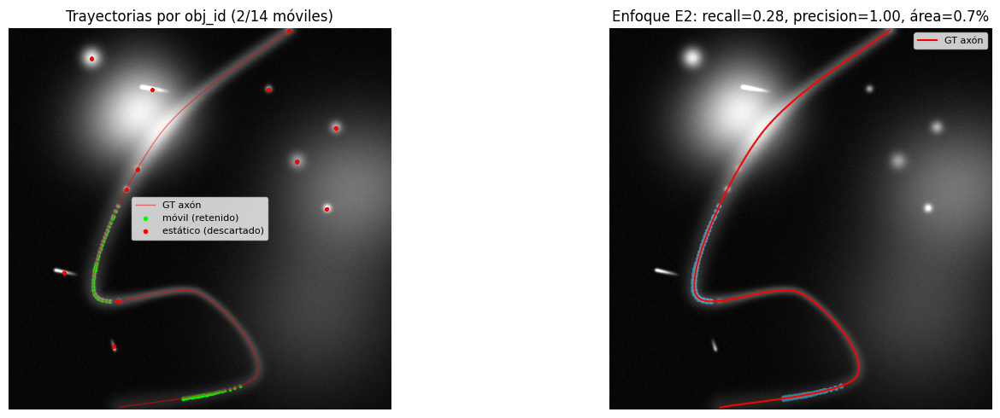

In [44]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].imshow(proj_max_u8, cmap="gray")
for obj_id, pts in trayectorias_e.items():
    xs_t = [p["cx"] for p in pts]
    ys_t = [p["cy"] for p in pts]
    color = "lime" if obj_id in objetos_moviles else "red"
    axes[0].plot(xs_t, ys_t, ".", color=color, ms=3, alpha=0.7)
axes[0].plot(poly[:, 0], poly[:, 1], "r-", lw=1.0, alpha=0.5, label="GT axón")
axes[0].plot([], [], ".", color="lime", label="móvil (retenido)")
axes[0].plot([], [], ".", color="red", label="estático (descartado)")
axes[0].set_title(
    f"Trayectorias por obj_id ({len(objetos_moviles)}/{len(trayectorias_e)} móviles)"
)
axes[0].legend(fontsize=8)
axes[0].axis("off")

axes[1].imshow(proj_max_u8, cmap="gray")
ov = np.zeros((H, W, 4), dtype=np.float32)
ov[union_mask_e2] = [0.2, 0.8, 1.0, 0.5]
axes[1].imshow(ov)
axes[1].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, label="GT axón")
axes[1].set_title(
    f"Enfoque E2: recall={met_e2['recall']:.2f}, precision={met_e2['precision']:.2f}, "
    f"área={100*met_e2['area_frac']:.1f}%"
)
axes[1].legend(fontsize=8)
axes[1].axis("off")

plt.tight_layout()
plt.show()

---

## 12. Enfoque F — proyección de desviación estándar (el camino, sin tracking)

Enfoques E/E2 usaron el tracker de SAM3-Video para responder una pregunta puntual: **¿qué píxeles vieron pasar algo?** -- pero para eso no hace falta mantener identidad de objeto entre frames; alcanza con medir si el brillo de cada píxel _cambia_ en el tiempo. Un artefacto estático tiene el mismo valor en todos los frames (varianza temporal ≈ 0). Una partícula que pasa por un píxel lo prende y apaga (varianza temporal alta). Eso es "el camino": no quién pasó, ni cuándo, sino por dónde.

`proj_std = movie.std(axis=0)` es la proyección temporal que faltaba en la sección 2 (ahí solo se probaron media y máxima). En este `CONFIG`, `tube.brightness=0.0` -- el axón no tiene brillo propio, solo es visible por lo que se mueve sobre él -- así que es exactamente el escenario donde media/máxima (Enfoque A) fallan y varianza debería funcionar.

Sin SAM3, sin tracker, sin prompt de texto: un umbral de Otsu sobre `proj_std`, nada más. Si el resultado fuera ruidoso, ahí valdría la pena agregar SAM3 encima (mismo patrón que Enfoque C) -- pero se prueba primero la versión clásica, mucho más barata, antes de asumir que hace falta un modelo.


In [12]:
from skimage.filters import threshold_otsu
from scipy.ndimage import binary_closing

proj_std = movie.astype(np.float32).std(axis=0)  # (H, W)

thr_std = threshold_otsu(proj_std)
mask_f = proj_std > thr_std
met_f = evaluar_mascara(mask_f, poly)
print(f"Enfoque F -- std-projection + Otsu (sin closing):")
print(
    f"  threshold={thr_std:.1f}  recall={met_f['recall']:.2f}  precision={met_f['precision']:.2f}  "
    f"f_beta={met_f['f_beta']:.2f}  área={100*met_f['area_frac']:.1f}%  dist_media={met_f['mean_dist_gt_px']:.1f}px"
)

# closing no ayudo en las pruebas (el area ya es compacta -- cerrar de mas
# empeora el recall al fusionar con ruido cercano). Se deja como parametro
# visible, en 0, por consistencia con Enfoque C -- no porque haga falta.
CLOSING_RADIUS_F = 0
if CLOSING_RADIUS_F > 0:
    mask_f = binary_closing(mask_f, iterations=CLOSING_RADIUS_F)
    met_f = evaluar_mascara(mask_f, poly)
    print(
        f"  con closing={CLOSING_RADIUS_F}px: recall={met_f['recall']:.2f}  precision={met_f['precision']:.2f}"
    )

print(
    f"\nComparación con E2 (SAM3-Video + filtro por desplazamiento, {elapsed_e:.0f}s de cómputo):"
)
print(
    f"  E2: recall={met_e2['recall']:.2f}  precision={met_e2['precision']:.2f}  área={100*met_e2['area_frac']:.1f}%"
)
print(
    f"  F:  recall={met_f['recall']:.2f}  precision={met_f['precision']:.2f}  área={100*met_f['area_frac']:.1f}%  "
    f"(costo: una resta de arrays, <1s vs. {elapsed_e:.0f}s de SAM3-Video)"
)

NameError: name 'evaluar_mascara' is not defined

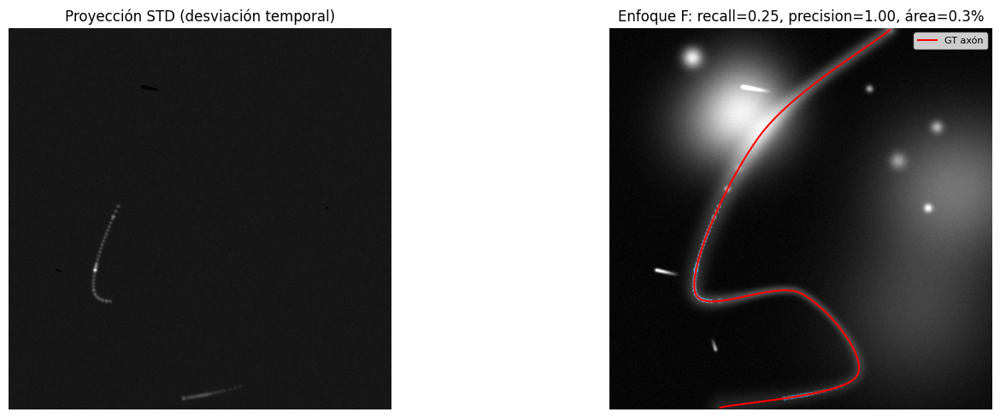

In [46]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

axes[0].imshow(norm_uint8(proj_std), cmap="gray")
axes[0].set_title("Proyección STD (desviación temporal)")
axes[0].axis("off")

axes[1].imshow(proj_max_u8, cmap="gray")
ov = np.zeros((H, W, 4), dtype=np.float32)
ov[mask_f] = [0.2, 0.8, 1.0, 0.5]
axes[1].imshow(ov)
axes[1].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, label="GT axón")
axes[1].set_title(
    f"Enfoque F: recall={met_f['recall']:.2f}, precision={met_f['precision']:.2f}, "
    f"área={100*met_f['area_frac']:.1f}%"
)
axes[1].legend(fontsize=8)
axes[1].axis("off")

plt.tight_layout()
plt.show()

---

## 13. Enfoque G — filtro de cresta (ridge/vesselness) sobre proyección media

Con `tube.brightness > 0` el axón tiene señal visual propia: es una franja brillante y **alargada**, visible de punta a punta aunque ninguna partícula la haya recorrido. Eso levanta el techo de recall que limitaba a A–F, todos capados por la cobertura de movimiento (ver Conclusión, escenario `brightness=0.0`: sin brillo propio, un tramo que nada atraviesa es irrecuperable).

Pero una proyección media brillante no alcanza por sí sola: los cuerpos celulares, las partículas estáticas y el "smoke" también son brillantes (artefactos de `config.yaml`). Un umbral de intensidad simple no separa el tubo de esos _blobs_, y SAM3 con `"bright elongated structure"` ya dio prácticamente nada (sección 4 — la fluorescencia está fuera de su distribución de entrenamiento).

El **filtro de cresta** (Frangi / Sato / Meijering, diseñados originalmente para neuritas y vasos) es la herramienta clásica para exactamente esto: responde a estructura **tubular/alargada** y **suprime** los blobs, usando la relación entre los autovalores del Hessiano (una cresta tiene un autovalor grande y otro chico; un blob, los dos grandes). Es el análogo por apariencia del Enfoque F: clásico, barato, sin modelo. Probamos los tres filtros y nos quedamos con el mejor por F-beta, excluyendo degenerados que cubren casi todo el frame (misma salvaguarda que la sección 6).


In [19]:
from skimage.filters import sato, frangi, meijering

# El tubo mide ~0.5um / 0.07 um/px ~= 7px de ancho, y el glow gaussiano del
# render (movie.py:_tube_image, base_sigma ~= width_um/pixel_scale) lo ensancha
# mas -- las escalas del filtro tienen que cubrir ese rango, no solo 1-2px.
# black_ridges=False: la cresta es BRILLANTE sobre fondo oscuro (fluorescencia).
RIDGE_SIGMAS = np.arange(1, 8)  # px

# proj_mean (seccion 2) destaca el tubo -siempre brillante- y promedia las
# particulas transitorias. Normalizamos a [0,1]: la respuesta del Hessiano
# depende de la escala de intensidad, conviene fijarla.
proj_mean_norm = (proj_mean - proj_mean.min()) / max(
    float(proj_mean.max() - proj_mean.min()), 1e-6
)

filtros_ridge = {
    "sato": lambda im: sato(im, sigmas=RIDGE_SIGMAS, black_ridges=False),
    "frangi": lambda im: frangi(im, sigmas=RIDGE_SIGMAS, black_ridges=False),
    "meijering": lambda im: meijering(im, sigmas=RIDGE_SIGMAS, black_ridges=False),
}

print("Enfoque G -- filtro de cresta sobre proyeccion media + Otsu\n")
resultados_g = {}
for nombre, filtro in filtros_ridge.items():
    resp = np.nan_to_num(filtro(proj_mean_norm))  # los filtros dan NaN en bordes
    # Otsu sobre la respuesta (muy sesgada hacia 0). Si hiciera falta mas
    # sensibilidad, un percentil alto (p.ej. p97) es la alternativa natural.
    thr = threshold_otsu(resp) if resp.max() > resp.min() else np.inf
    mask = resp > thr
    met = evaluar_mascara(mask, poly)
    resultados_g[nombre] = (resp, mask, met)
    print(
        f'  {nombre:10s} recall={met["recall"]:.2f}  precision={met["precision"]:.2f}  '
        f'f_beta={met["f_beta"]:.2f}  area={100*met["area_frac"]:.1f}%  '
        f'dist={met["mean_dist_gt_px"]:.1f}px'
    )

# Mejor filtro por f_beta entre los NO degenerados (area < 50% -- recall/f_beta
# se ganan trivialmente cubriendo todo el frame, ver seccion 6). Si todos son
# degenerados, cae de nuevo a todos (mejor esfuerzo).
candidatos = {n: v for n, v in resultados_g.items() if v[2]["area_frac"] < 0.5}
mejor_g = max(candidatos or resultados_g, key=lambda n: resultados_g[n][2]["f_beta"])
resp_g, mask_g, met_g = resultados_g[mejor_g]
print(f"\nMejor filtro (por f_beta, area<50%): {mejor_g}")

Enfoque G -- filtro de cresta sobre proyeccion media + Otsu

  sato       recall=0.80  precision=0.57  f_beta=0.74  area=7.0%  dist=7.6px
  frangi     recall=0.01  precision=0.25  f_beta=0.01  area=0.1%  dist=123.1px
  meijering  recall=0.79  precision=0.64  f_beta=0.75  area=6.1%  dist=8.0px

Mejor filtro (por f_beta, area<50%): meijering


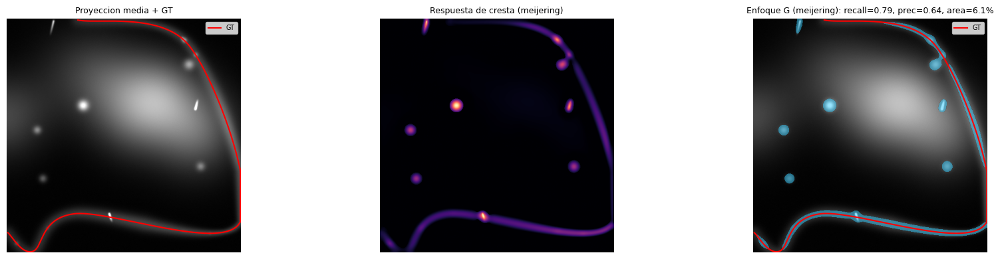

In [20]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

axes[0].imshow(proj_mean_u8, cmap="gray")
axes[0].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, label="GT")
axes[0].set_title("Proyeccion media + GT", fontsize=9)
axes[0].legend(fontsize=7)
axes[0].axis("off")

axes[1].imshow(norm_uint8(resp_g), cmap="magma")
axes[1].set_title(f"Respuesta de cresta ({mejor_g})", fontsize=9)
axes[1].axis("off")

axes[2].imshow(proj_mean_u8, cmap="gray")
ov = np.zeros((H, W, 4), dtype=np.float32)
ov[mask_g] = [0.2, 0.8, 1.0, 0.5]
axes[2].imshow(ov)
axes[2].plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, label="GT")
axes[2].set_title(
    f"Enfoque G ({mejor_g}): recall={met_g['recall']:.2f}, "
    f"prec={met_g['precision']:.2f}, area={100*met_g['area_frac']:.1f}%",
    fontsize=9,
)
axes[2].legend(fontsize=7)
axes[2].axis("off")

plt.tight_layout()
plt.show()

---

## 14. Enfoque H — fusión: apariencia (G) + movimiento (F)

Ningún canal solo cubre todos los videos. El canal de **apariencia** (G) recupera el tubo donde brilla, de punta a punta, sin depender de que una partícula lo haya recorrido — pero necesita que el axón tenga brillo propio (`tube.brightness > 0`). El canal de **movimiento** (F) recupera dónde pasó algo, aunque el tubo sea tenue o invisible — pero está capado por la cobertura de las partículas. En videos reales conviven ambos casos: algunos axones se ven claros a simple vista, otros no (esa heterogeneidad es la razón de fusionar en vez de elegir uno).

La unión `G | F` deja que cada canal aporte donde el otro falla: por construcción `recall(H) ≥ max(recall(G), recall(F))`, a costa de que unir solo puede **bajar** la precisión, nunca subirla (mismo trade-off recall/precisión de la sección 6). La lectura correcta es el par (recall, precisión), no un número único: H gana si sube recall más de lo que pierde en precisión respecto del mejor canal individual.


In [21]:
mask_h = mask_g | mask_f
met_h = evaluar_mascara(mask_h, poly)

print("Enfoque H -- union canal apariencia (G) + canal movimiento (F):")
print(
    f"  G (apariencia, {mejor_g:9s}): recall={met_g['recall']:.2f}  "
    f"precision={met_g['precision']:.2f}  area={100*met_g['area_frac']:.1f}%"
)
print(
    f"  F (movimiento, std+Otsu): recall={met_f['recall']:.2f}  "
    f"precision={met_f['precision']:.2f}  area={100*met_f['area_frac']:.1f}%"
)
print(
    f"  H (union G|F):            recall={met_h['recall']:.2f}  "
    f"precision={met_h['precision']:.2f}  area={100*met_h['area_frac']:.1f}%"
)
print(
    f"    Delta recall vs mejor(G,F) = "
    f"{met_h['recall'] - max(met_g['recall'], met_f['recall']):+.2f}   "
    f"Delta precision vs mejor(G,F) = "
    f"{met_h['precision'] - max(met_g['precision'], met_f['precision']):+.2f}"
)

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
for ax, (mask, titulo, met) in zip(
    axes,
    [
        (mask_g, f"G apariencia ({mejor_g})", met_g),
        (mask_f, "F movimiento (std)", met_f),
        (mask_h, "H union G|F", met_h),
    ],
):
    ax.imshow(proj_max_u8, cmap="gray")
    ov = np.zeros((H, W, 4), dtype=np.float32)
    ov[mask] = [0.2, 0.8, 1.0, 0.5]
    ax.imshow(ov)
    ax.plot(poly[:, 0], poly[:, 1], "r-", lw=1.5, label="GT")
    ax.set_title(
        f"{titulo}\nrecall={met['recall']:.2f}  prec={met['precision']:.2f}  "
        f"area={100*met['area_frac']:.1f}%",
        fontsize=9,
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

Enfoque H -- union canal apariencia (G) + canal movimiento (F):
  G (apariencia, meijering): recall=0.79  precision=0.64  area=6.1%


NameError: name 'met_f' is not defined

---

## 15. Comparación final A vs B vs C vs D vs E vs E2 vs F vs G vs H

La tabla de abajo refleja la corrida **actualmente guardada** (escenario realista, sección 1). Para los números del escenario idealizado (cobertura garantizada), ver la tabla comparativa en la Conclusión -- no están en los outputs de las celdas de este notebook porque ejecutarlas de nuevo sobrescribiría estos resultados.

Nota: G y H sólo tienen sentido con `tube.brightness > 0` (sección 1). Con el tubo invisible (`brightness=0.0`, el escenario original de este notebook) el canal de apariencia de G no tiene nada que detectar y H colapsa a F.


In [50]:
print(
    f"{'Enfoque':45s}  {'Recall':>7}  {'Prec':>7}  {'F_beta':>7}  {'Área%':>7}  {'Dist(px)':>9}"
)
print("-" * 100)

print("  A -- proyección media + texto:")
for q, (masks, _) in resultados_texto.items():
    if len(masks) == 0:
        print(f'    "{q:35s}"   sin máscaras')
        continue
    m = evaluar_mascara(masks[0], poly)
    print(
        f'    "{q:35s}"  {m["recall"]:7.2f}  {m["precision"]:7.2f}  '
        f'{m["f_beta"]:7.2f}  {100*m["area_frac"]:6.1f}%  {m["mean_dist_gt_px"]:9.1f}'
    )

print("  A -- proyección media + bbox entera:")
for i, m_arr in enumerate(masks_box[:3]):
    m = evaluar_mascara(m_arr, poly)
    print(
        f'    máscara {i}                                 {m["recall"]:7.2f}  {m["precision"]:7.2f}  '
        f'{m["f_beta"]:7.2f}  {100*m["area_frac"]:6.1f}%  {m["mean_dist_gt_px"]:9.1f}'
    )

print(f"  B -- unión frames muestreados ({N_SAMPLE_FRAMES} frames):")
print(
    f'    "small bright dot"                            {met_union["recall"]:7.2f}  {met_union["precision"]:7.2f}  '
    f'{met_union["f_beta"]:7.2f}  {100*met_union["area_frac"]:6.1f}%  {met_union["mean_dist_gt_px"]:9.1f}'
)

print(f"  C -- proyección MAX + closing={CLOSING_RADIUS_C}px:")
for q, (_, met) in resultados_c.items():
    print(
        f'    "{q:35s}"  {met["recall"]:7.2f}  {met["precision"]:7.2f}  '
        f'{met["f_beta"]:7.2f}  {100*met["area_frac"]:6.1f}%  {met["mean_dist_gt_px"]:9.1f}'
    )

print(
    f"  D -- spline sobre centroides (DBSCAN eps={DBSCAN_EPS}, smooth={SPLINE_SMOOTH}):"
)
if curva_pts is not None:
    print(
        f'    "small bright dot" + MST + splprep    {met_d["recall"]:7.2f}  {met_d["precision"]:7.2f}  '
        f'{met_d["f_beta"]:7.2f}  {100*met_d["area_frac"]:6.1f}%  {met_d["mean_dist_gt_px"]:9.1f}'
    )
else:
    print("    spline no disponible")

print(f"  E -- SAM3-Video, T={T} frames, SIN filtrar ({elapsed_e:.0f}s):")
print(
    f'    "{QUERY_PARTICULAS}"                          {met_e["recall"]:7.2f}  {met_e["precision"]:7.2f}  '
    f'{met_e["f_beta"]:7.2f}  {100*met_e["area_frac"]:6.1f}%  {met_e["mean_dist_gt_px"]:9.1f}'
)

print(
    f"  E2 -- SAM3-Video + filtro de objetos estáticos (desplazamiento > {DISPLACEMENT_THR_PX:.0f}px):"
)
print(
    f'    {len(objetos_moviles)}/{len(trayectorias_e)} objetos retenidos            {met_e2["recall"]:7.2f}  {met_e2["precision"]:7.2f}  '
    f'{met_e2["f_beta"]:7.2f}  {100*met_e2["area_frac"]:6.1f}%  {met_e2["mean_dist_gt_px"]:9.1f}'
)

print(f"  F -- std-projection + Otsu (sin closing, sin SAM3):")
print(
    f'    threshold={thr_std:.0f}                                        {met_f["recall"]:7.2f}  {met_f["precision"]:7.2f}  '
    f'{met_f["f_beta"]:7.2f}  {100*met_f["area_frac"]:6.1f}%  {met_f["mean_dist_gt_px"]:9.1f}'
)
print(f"  G -- filtro de cresta sobre proyeccion media (mejor: {mejor_g}):")
for nombre, (_, _, met) in resultados_g.items():
    marca = " *" if nombre == mejor_g else "  "
    print(
        f'    {nombre:33s}{marca}  {met["recall"]:7.2f}  {met["precision"]:7.2f}  '
        f'{met["f_beta"]:7.2f}  {100*met["area_frac"]:6.1f}%  {met["mean_dist_gt_px"]:9.1f}'
    )

print(f"  H -- fusion apariencia (G:{mejor_g}) | movimiento (F):")
print(
    f'    union G | F                            {met_h["recall"]:7.2f}  {met_h["precision"]:7.2f}  '
    f'{met_h["f_beta"]:7.2f}  {100*met_h["area_frac"]:6.1f}%  {met_h["mean_dist_gt_px"]:9.1f}'
)

Enfoque                                         Recall     Prec   F_beta    Área%   Dist(px)
----------------------------------------------------------------------------------------------------
  A -- proyección media + texto:
    "bright elongated structure         "     0.00     0.00     0.00     0.1%      223.4
    "bright fluorescent axon            "     0.00     0.00     0.00     0.1%      276.0
    "bright line                        "     0.00     0.00     0.00     0.0%      184.7
    "bright tube                        "     1.00     0.65     0.90     6.2%        0.1
  A -- proyección media + bbox entera:
    máscara 0                                    0.00     0.00     0.00    53.8%       13.3
  B -- unión frames muestreados (32 frames):
    "small bright dot"                               0.35     0.40     0.36     1.6%       29.9
  C -- proyección MAX + closing=8px:
    "small bright dot                   "     0.12     0.13     0.12     1.0%       41.3
    "bright path   

## Conclusión

Este notebook explora si un modelo de visión puede detectar el ROI del axón automáticamente desde video sintético con ground truth exacto. La variable decisiva resultó ser una que las corridas originales mantenían fija en cero: **el brillo propio del tubo del axón** (`movie.tube.brightness`). Con `brightness=0.0` el axón no tiene ninguna señal visual propia y sólo es visible por lo que se mueve sobre él; con `brightness>0` es una franja brillante y alargada, visible de punta a punta. Esa diferencia reordena por completo qué enfoques funcionan.

### Tres condiciones probadas

1. **Idealizado** (`brightness=0.0`, cobertura garantizada — histórico). Seed 1940224724, partículas ajustadas a mano para atravesar el axón de punta a punta. Sirvió para confirmar que cada mecanismo funciona en absoluto: E/F llegan a recall ~1.00.
2. **Realista, tubo invisible** (`brightness=0.0`, cobertura parcial — histórico). Seed 35, valores de `config.yaml`. Nada garantiza que las partículas recorran el axón (cubren ~55% de envolvente, en dos tramos). El recall se desploma a 0.19–0.35 para **todos** los enfoques: sin brillo propio, la cobertura de movimiento es la única señal, y ninguno recupera un tramo que nada atravesó.
3. **Realista, tubo visible** (`brightness=0.2`, cobertura parcial — la corrida guardada arriba). Mismo seed 35, misma cobertura parcial que (2); lo único que cambia es que el tubo ahora brilla.

### El experimento controlado que habilita (3)

Como (2) y (3) comparten seed y cobertura y **sólo** difieren en `tube.brightness` (0.0 → 0.2), su comparación aísla limpiamente el efecto del brillo del tubo (a diferencia de (1) vs (2), que además cambian de seed y por lo tanto de geometría del axón). El resultado parte los enfoques en dos:

- Los de **movimiento** casi no se mueven: E 0.35, B 0.35, E2 0.28, F 0.25, D 0.19 — igual que con el tubo invisible. El brillo del tubo no les aporta nada, porque miden dónde pasó algo, no dónde hay estructura.
- Los de **apariencia** se disparan de ~0 a recall alto: SAM3 texto `"bright tube"` **1.00**/0.65, SAM3 `"bright streak"` sobre proyección MAX **0.99**/0.60, y el filtro de cresta nuevo (G) **0.90**/0.62 — todos sobre el mismo axón que en (2) era irrecuperable.

Esto **confirma empíricamente la predicción de la condición (2)**: el techo de ~0.35 nunca fue un límite de la detección del ROI, sino un artefacto de `brightness=0.0`. Cuando el axón tiene señal visual propia es visible donde ninguna partícula pasó, y el recall se despega de la cobertura de movimiento. También matiza un hallazgo anterior: "SAM3 texto no engancha el axón" también era efecto del tubo invisible — con tubo visible, `"bright tube"` lo segmenta perfecto (aunque sigue siendo frágil al prompt: de 4 frases sólo esa funcionó).

### Comparación directa

| Enfoque                                         | (1) Idealizado `b=0`, cobertura total | (2) Realista `b=0`, tubo invisible | (3) Realista `b=0.2`, tubo visible |
| ----------------------------------------------- | ------------------------------------- | ---------------------------------- | ---------------------------------- |
| A — `"bright tube"` (SAM3 texto)                | ~0                                    | ~0                                 | **1.00 / 0.65**                    |
| A — bbox completa (degenerado)                  | 1.00 / 0.04 (área 95%)                | 1.00 / 0.04 (área 97%)             | 0.00 / 0.00 (área 54%)             |
| B — frames muestreados                          | 0.50 / 0.36                           | 0.35 / 0.42                        | 0.35 / 0.40                        |
| C — `"bright streak"` (MAX + SAM3)              | ~0.09                                 | ~0.30 / 0.72                       | **0.99 / 0.60**                    |
| D — spline sobre centroides                     | 0.06 / 0.96                           | 0.19 / 0.91                        | 0.19 / 0.91                        |
| E — SAM3-Video sin filtrar                      | 1.00 / 0.71                           | 0.35 / 0.60                        | 0.35 / 0.48                        |
| E2 — SAM3-Video + filtro desplaz.               | 0.98 / 0.96                           | 0.28 / 1.00                        | 0.28 / 1.00                        |
| F — std-projection + Otsu                       | 0.98 / 1.00                           | 0.25 / 1.00                        | 0.25 / 1.00                        |
| **G — filtro de cresta (meijering)**            | —                                     | —                                  | **0.90 / 0.62**                    |
| **H — fusión apariencia (G) \| movimiento (F)** | —                                     | —                                  | **0.91 / 0.63**                    |

G y H no tienen fila en (1)–(2): con el tubo invisible el canal de apariencia no tiene nada que detectar (recall ≈ 0 por construcción), y por eso sólo son significativos con `brightness>0`.

### Los dos enfoques nuevos

**G — filtro de cresta (ridge/vesselness).** Es el análogo por apariencia de F: clásico, sin modelo, sin prompt. Empata a la mejor variante de SAM3 (meijering 0.90/0.62 vs `"bright tube"` 1.00/0.65) al costo de una convolución — la misma moraleja que F vs E2 en el escenario idealizado, ahora del lado de la apariencia: la parte cara (el modelo) no era la que hacía el trabajo. Advertencia práctica: **la elección de filtro importa**. Sato y Meijering dan recall ~0.90; **Frangi dio 0.00 en este seed** (no enganchó el tubo, probablemente por cómo su término de contraste/β responde a esta geometría de intensidad). No asumir que "un filtro de cresta" es intercambiable — hay que elegir por métrica, no por default.

**H — fusión G | F.** En este video aporta casi nada sobre G solo (Δrecall +0.02, precisión ≈ igual): un tubo brillante ya es visible donde las partículas se mueven, así que G cubre la región de F. Eso **no** es evidencia de que la fusión no sirva — es que su valor no está _dentro_ de un video brillante, sino _a lo ancho de un dataset heterogéneo_. La observación que originó estos enfoques (algunos axones reales se ven claros a simple vista y otros no) implica videos de los dos tipos: H deja que el canal de apariencia lleve los brillantes y el de movimiento rescate los tenues (la condición 2, donde G daría ~0 y sólo F/E2 aportan algo). Medir la ganancia real de H requiere correrlo sobre videos de ambos tipos —o sobre un `brightness` bajo intermedio, donde el tubo apenas se distinga del fondo—, no sobre este único caso brillante donde G ya gana.

### Qué se mantiene y qué cambia

- **Se mantiene:** E2 y F siguen en precisión ~1.00 en las tres condiciones — filtrar por desplazamiento o por varianza temporal distingue movimiento real de artefactos estáticos sin importar el brillo del tubo. Y el límite de fondo sigue en pie: ningún enfoque de _movimiento_ recupera un tramo que nada atravesó.
- **Cambia:** ese límite dejó de ser el techo global. Con `brightness>0` el canal de _apariencia_ recupera exactamente los tramos que el de movimiento no puede, y el recall total sube de ~0.35 a ~0.90. La pregunta ya no es "¿es imposible detectar el ROI con cobertura parcial?" (respondida en (2): sí, si el tubo es invisible) sino "¿qué tan brillante tiene que ser el tubo real para que la apariencia alcance?" — medible en sintético barriendo `brightness`.

### Por qué el sintético sigue siendo clave

Permite medir recall y precisión del detector del ROI con ground truth exacto y —como muestra la comparación (2) vs (3)— barrer una variable física (`tube.brightness`) manteniendo todo lo demás fijo. En video real no existe ni la referencia ni ese control.

### Próximos pasos

1. **Barrer `tube.brightness`** (p.ej. 0.0, 0.05, 0.1, 0.2) con seed fijo: mapear a partir de qué brillo el canal de apariencia (G/A/C) despega, y dónde queda la zona gris en la que sólo la fusión H mantiene recall. Es la medición que este único punto (`b=0.2`) no da.
2. **Múltiples seeds por condición** — sigue pendiente del análisis anterior: confirmar que G≈SAM3 y que Frangi falla no son ruido de un solo seed, y separar cobertura de geometría del axón.
3. **Calibrar contra video real:** estimar el `brightness` efectivo de los axones del laboratorio (los que se ven a simple vista vs los tenues) para saber en cuál de las tres condiciones cae el dataset real — y por lo tanto si conviene apoyarse en apariencia (G), en movimiento (F/E2), o en la fusión (H).
4. **Nivel 2 (ruido, iluminación no uniforme):** G se apoya en la proyección media, más robusta al ruido temporal que la varianza de F; F sigue siendo más sensible. Bajo ruido fuerte, H podría heredar lo mejor de cada canal — verificarlo, no asumirlo.
5. **Costo en resolución real:** G y F corren directo sobre la resolución del video real (1279×1148 px), sin el reescalado a 1008px que sí sufren A–E2 (SAM3). Para axones brillantes, G es el candidato más barato y sin pérdida de resolución.
